In [9]:
from epyt import epanet
import numpy as np
import matplotlib.pyplot as plt
G = epanet("leaking_network2.inp")
day_len = int((24*60*60)/G.getTimePatternStep())
hr_len = int(day_len/24)
pat_len = 7*day_len

EPANET version 20200 loaded (EPyT version v1.2.1 - Last Update: 09/01/2024).
Input File leaking_network2.inp loaded successfully.



In [10]:
import os

In [11]:
leak_nodes = G.getNodeNameID()[1: -1]
leak_nodes

['11', '12', '13', '21', '22', '23']

In [12]:
leakage_mult = [0.05, 0.25, 0.5, 0.75, 1.0, 1.5]

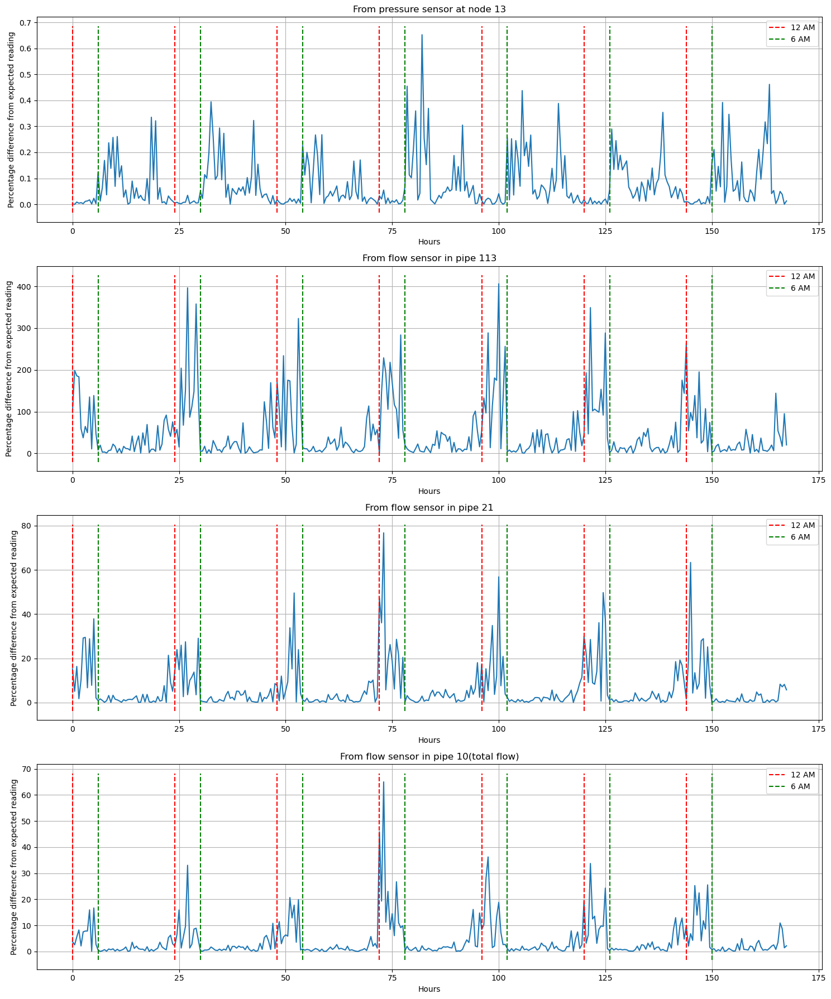

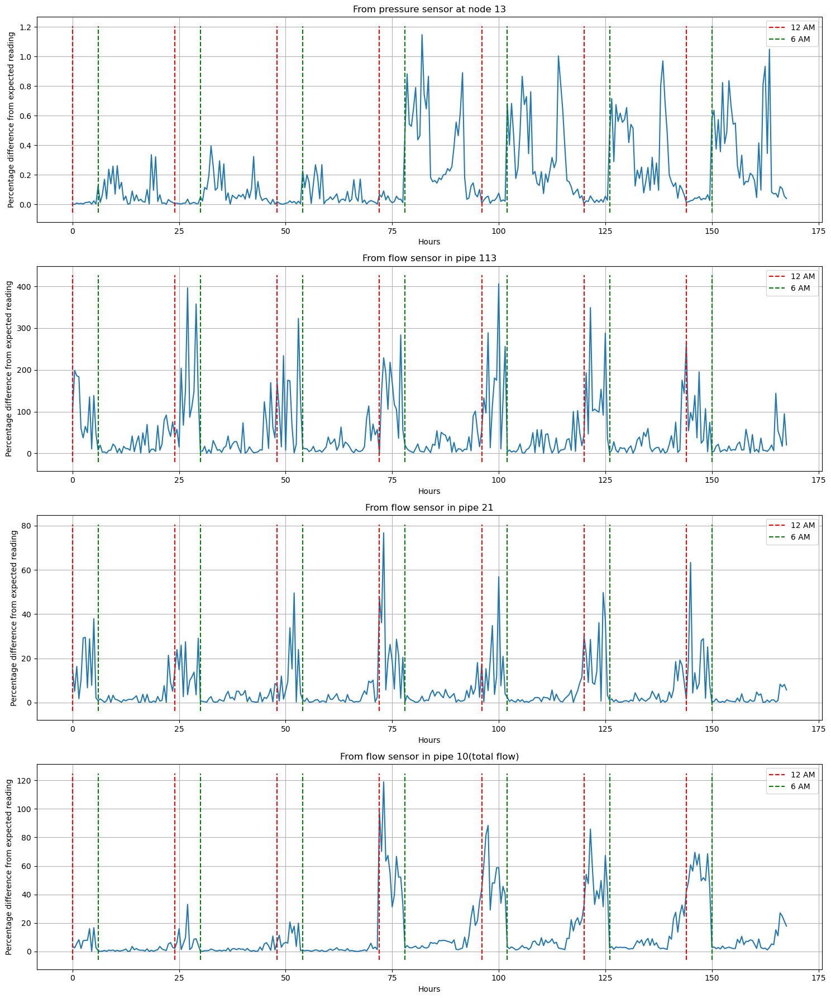

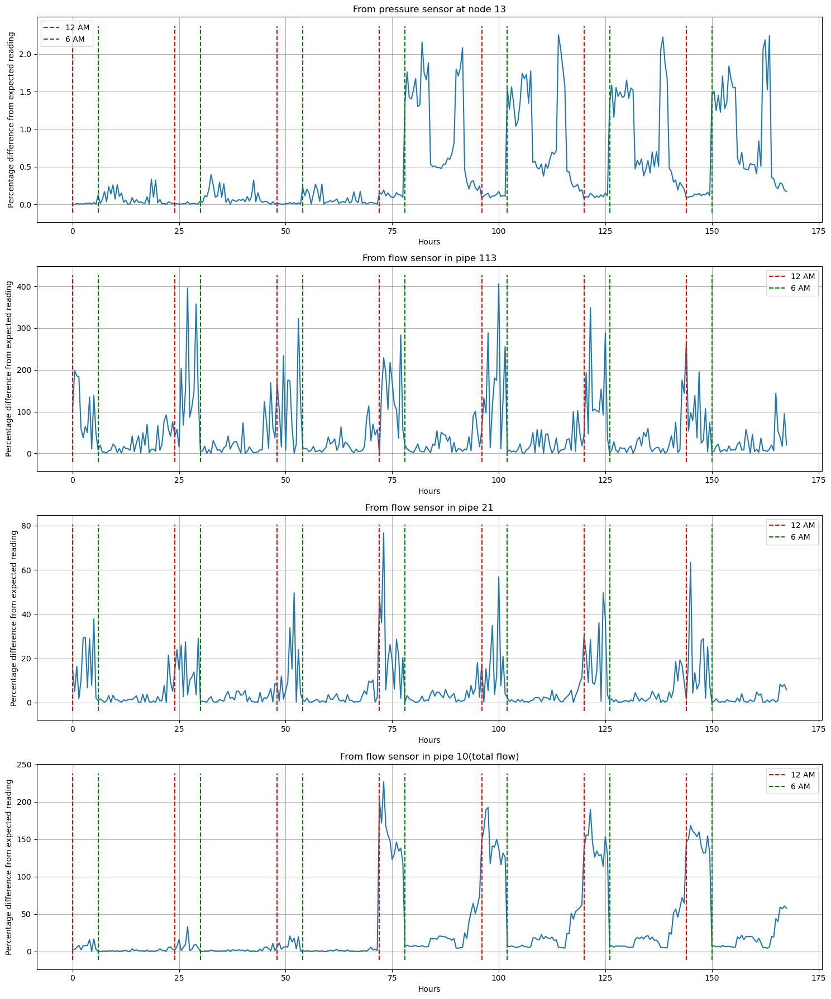

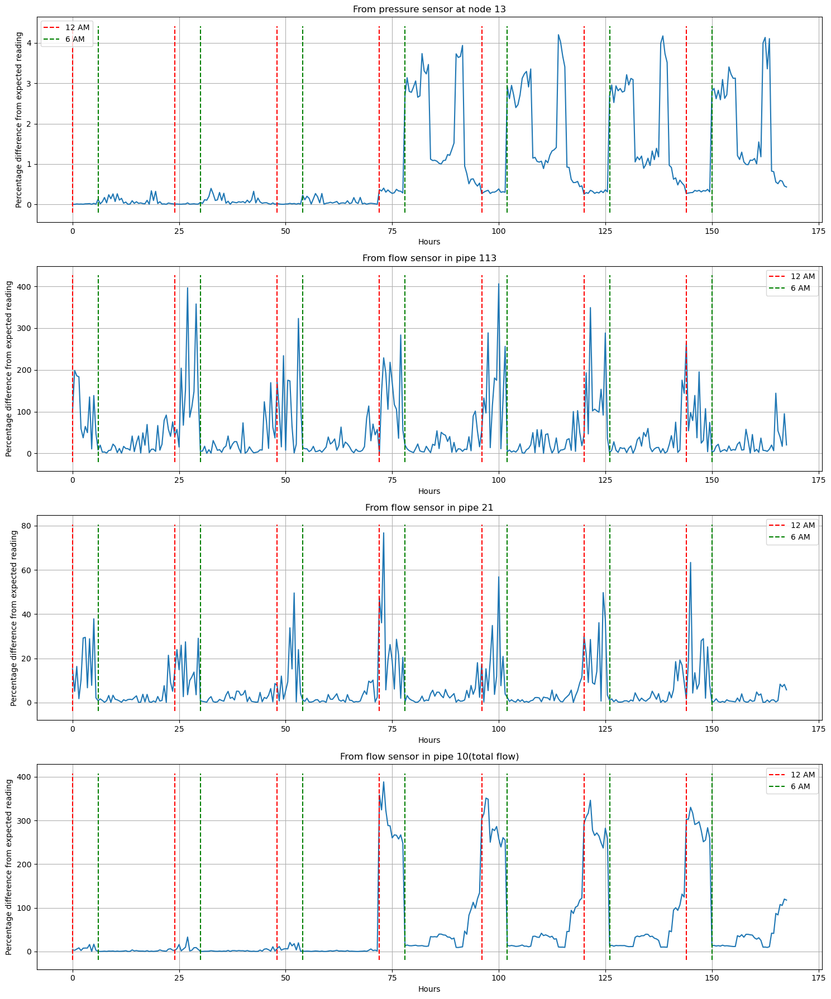

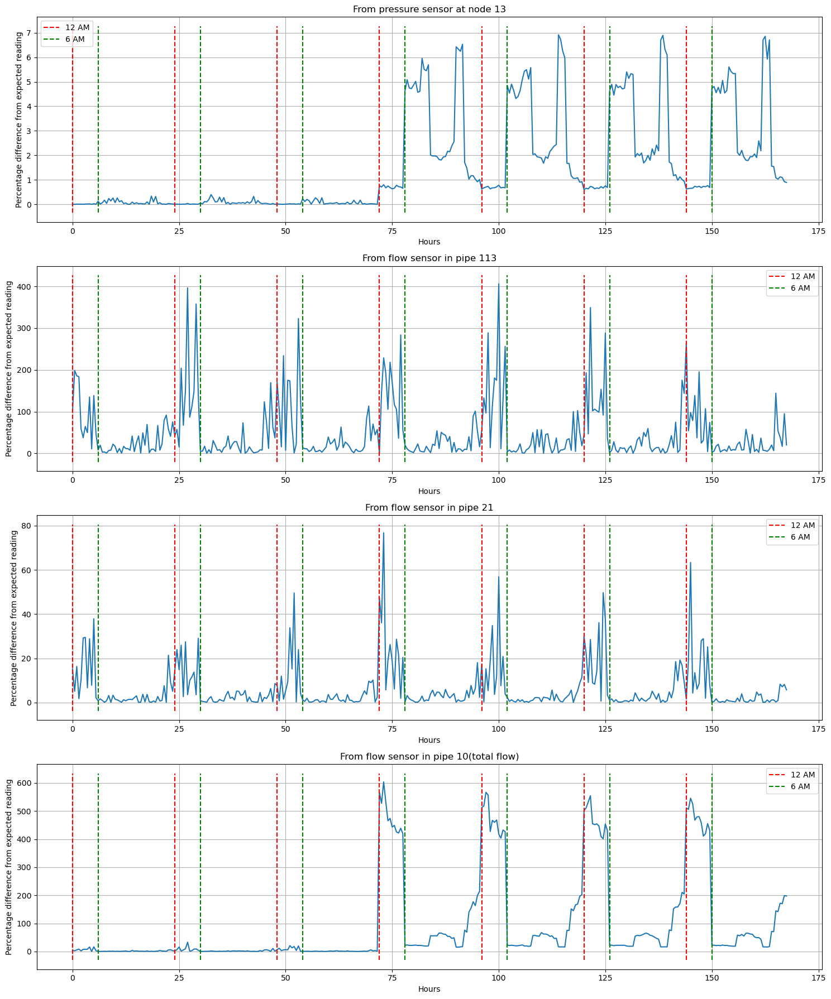

...

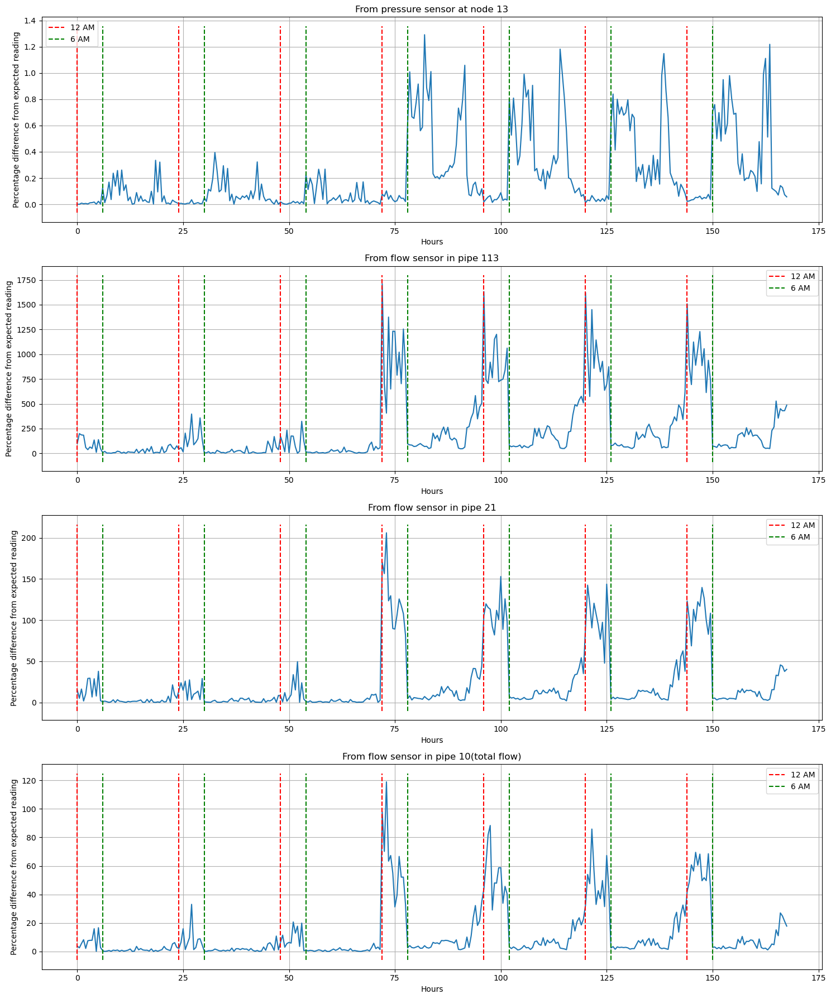

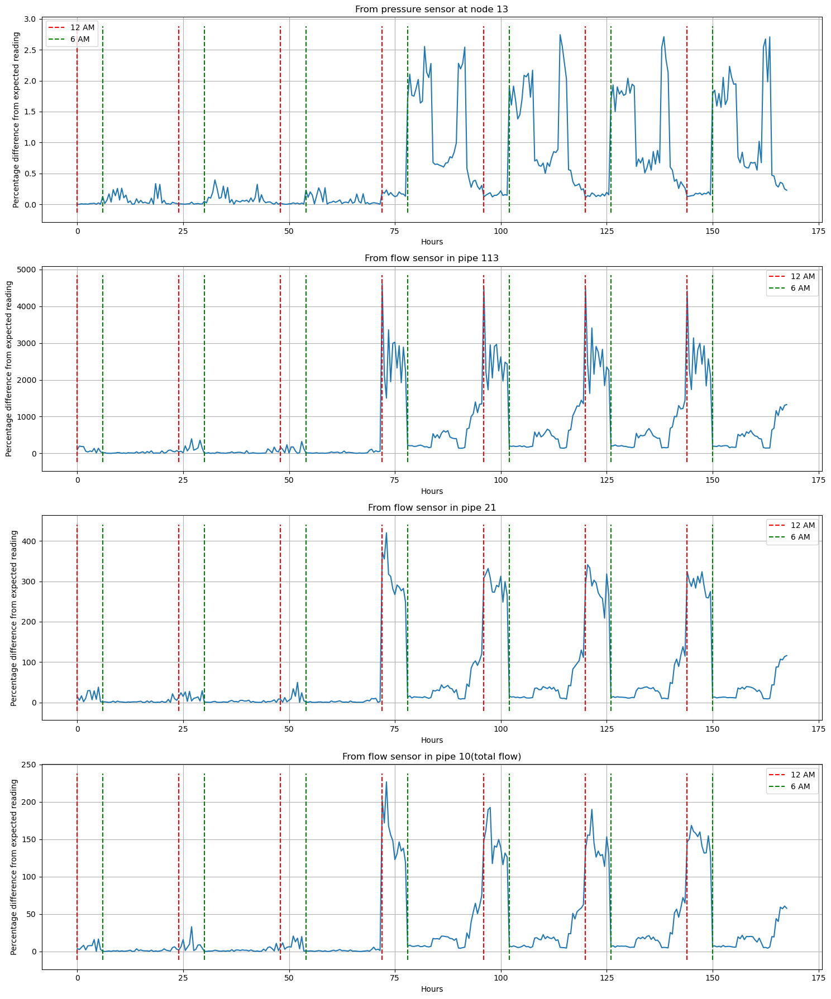

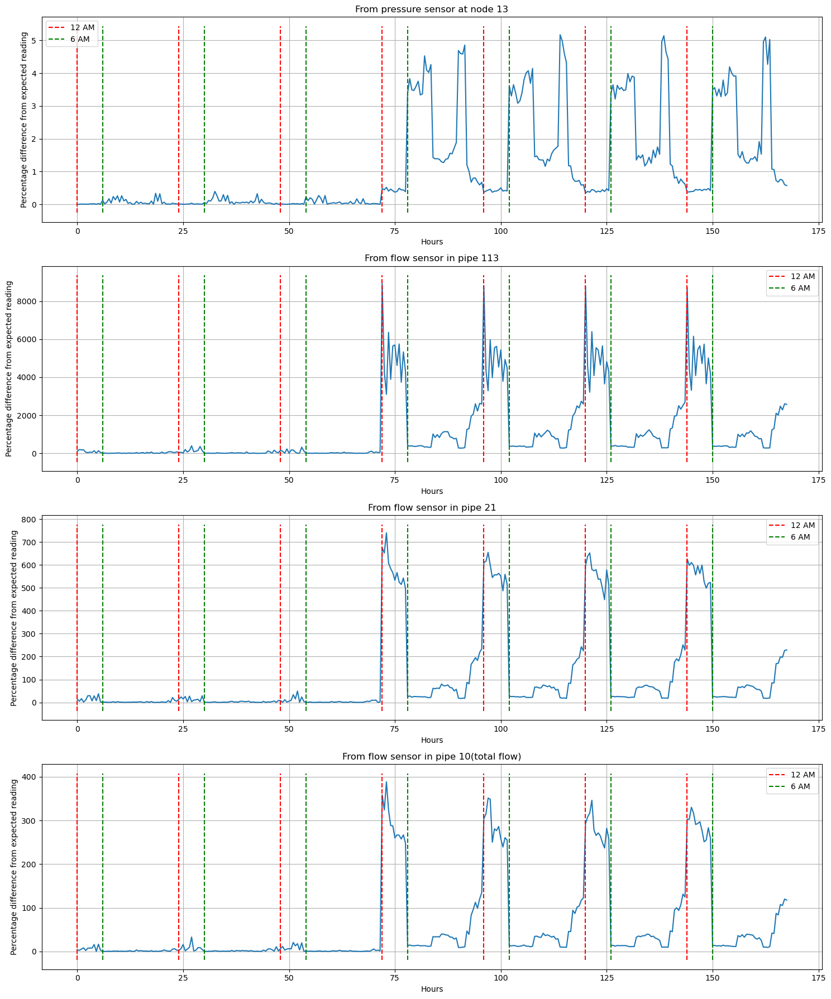

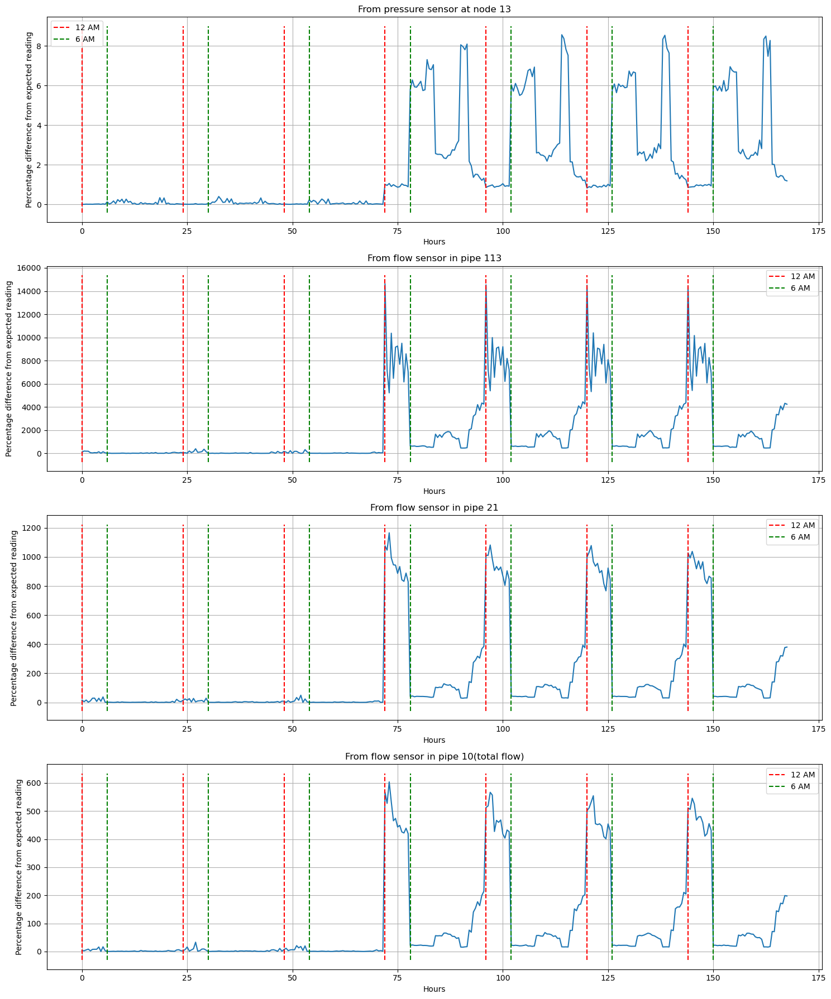

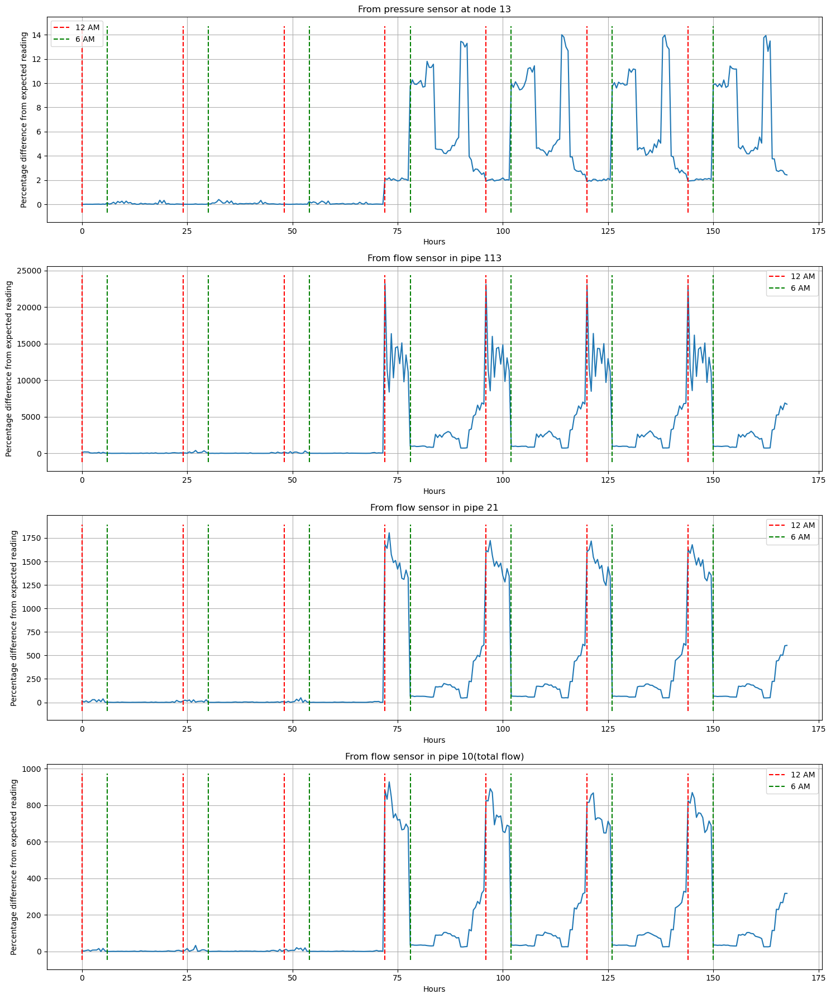

In [13]:
current_dir = os.getcwd()
dataset_folder = os.path.join(current_dir, "leak_scenerio_sensor_readings_percentage_deviations")
os.makedirs(dataset_folder, exist_ok=True)

current_dir = os.getcwd()
dataset_folder_graphs = os.path.join(current_dir, "leak_scenerio_sensor_readings_percentage_deviations_graphs")
os.makedirs(dataset_folder_graphs, exist_ok=True)

for nodeID in leak_nodes:

    lnod_ind = G.getNodeIndex(nodeID)
    ori_lnode_pat_ind = G.getNodePatternIndex(lnod_ind)
    # print(f"start {lnod_ind}, {ori_lnode_pat_ind}")

    for mult in leakage_mult:

        lnod_ind = G.getNodeIndex(nodeID)
        dem = G.getNodeBaseDemands()[1][lnod_ind-1]

        add_dem = np.zeros(pat_len)
        add_dem[3*day_len:] = mult

        lnode_pat_ind = G.getNodePatternIndex(lnod_ind)
        total_l_dem = add_dem + G.getPattern()[lnode_pat_ind-1]

        name = f"nodeid{nodeID}leakmult{mult}"

        leak_pat_ind = G.addPattern(name, total_l_dem)

        G.setNodeDemandPatternIndex(lnod_ind, leak_pat_ind)
        
        H = G.getComputedHydraulicTimeSeries()

        Qi = G.getLinkIndex('10')
        q1i = G.getLinkIndex('113')
        q2i = G.getLinkIndex('21')

        G.openHydraulicAnalysis()
        G.initializeHydraulicAnalysis()
        tstep, T_H, Fl, f1l, f2l =1, [], [], [], []
        while tstep>0:
            t = G.runHydraulicAnalysis()
            Fl.append(G.getLinkFlows()[Qi-1])
            f1l.append(G.getLinkFlows()[q1i-1])
            f2l.append(G.getLinkFlows()[q2i-1])
            T_H.append(t)
            tstep=G.nextHydraulicAnalysisStep()
        G.closeHydraulicAnalysis()

        Fl = Fl[:-1]
        Fl= np.array(Fl)

        f1l = f1l[:-1]
        f1l= np.array(f1l)

        f2l = f2l[:-1]
        f2l= np.array(f2l)

        name13 = '13'
        index13 = G.getNodeNameID().index(name13)
        p13l= np.array(H.Pressure[:-1, index13])

        arrt = np.linspace(0, 23.5, 48)

        Xt = np.zeros((5, int(len(p13l)/30)))

        seq = np.tile(arrt, int(len(p13l)/30) // 48 + 1)[:int(len(p13l)/30)]
        Xt[0]=seq

        j=1
        for x in [p13l, f1l, f2l, Fl]:
            tmp = np.array([])
            for i in range(0, len(x), 30):
                val = np.average(x[i:i+30])
                tmp = np.append(tmp, val)
            Xt[j] = tmp
            j=j+1
        
        # plt.plot(Xt[1][:int(day_len/30)])
        
        dataX = np.load("X.npz")
        X = dataX["X"]

        a, b= Xt.shape
        ans = np.zeros((5,b))

        j=0
        for col in Xt.T:
            i = int(2*col[0])

            def safe_div(numerator, denominator):
                return abs(numerator - denominator) / denominator * 100 if denominator != 0 else 0

            a1 = safe_div(col[1], X[1, i])
            a2 = safe_div(col[2], X[2, i])
            a3 = safe_div(col[3], X[3, i])
            a4 = safe_div(col[4], X[4, i])
            a5 = (a1 + a2 + a3 + a4) / 4

            ans[:, j] = [a1, a2, a3, a4, a5]

            j=j+1

        np.savez(f"leak_scenerio_sensor_readings_percentage_deviations/{name}.npz", ans=ans)
        
        x_positions = np.arange(0, 168, 24)
        x2 = x_positions+6

        title = ["From pressure sensor at node 13", "From flow sensor in pipe 113", "From flow sensor in pipe 21", "From flow sensor in pipe 10(total flow)", "Average of all percentage deviations"]

        plt.figure(figsize=(15, 18))

        for i in range(4):
            x = np.arange(len(ans[i])) * 0.5

            plt.subplot(4, 1, i + 1)
            plt.grid(True)
            plt.title(title[i])
            plt.plot(x, ans[i])
            
            ymin, ymax = plt.ylim()
            plt.vlines(x_positions, ymin=ymin, ymax=ymax, color='r', linestyle='--', label="12 AM")
            plt.vlines(x2, ymin=ymin, ymax=ymax, color='g', linestyle='--', label="6 AM")
            
            plt.ylabel("Percentage difference from expected reading")
            
            
            plt.xlabel("Hours")
            
            plt.legend()

        plt.tight_layout()
        name2 = name + ".jpg"
        plt.savefig(f"leak_scenerio_sensor_readings_percentage_deviations_graphs/{name2}", dpi=300)
        plt.show()

    
    G.setNodeDemandPatternIndex(lnod_ind, ori_lnode_pat_ind)
    # print(f"end {G.getNodePatternIndex(lnod_ind)}")